# Dimensionality reduction and clustering

In this step of the pipeline, we are employing dimensionality reduction techniques such as PCA and UMAP to look at interesting data points in the set, and then run clustering with Louvain's method.

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
%matplotlib inline

import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

BATCH_LABELS = ("nontreated", "treated")

/home/ubuntu/.local/lib/python3.6/site-packages/numba/errors.py:105: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


scanpy==1.4 anndata==0.6.19 numpy==1.16.3 scipy==1.2.1 pandas==0.24.2 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


## Load previous data
We will now load the data saved in the previous step.

In [3]:
batches = {}

for batch in BATCH_LABELS:
    filename = "tgfb1-3-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    batches[batch] = anndata.read(filename)

batches

{'nontreated': AnnData object with n_obs × n_vars = 5019 × 7176 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'treated': AnnData object with n_obs × n_vars = 7047 × 7176 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced'}

## Confirm PCA tool data was saved
We will re-generate the old PCA plots for each batch as a confirmation that the data has been saved.

PCA plot for batch nontreated


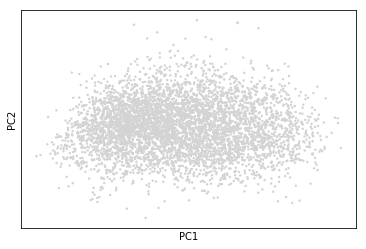

PCA plot for batch treated


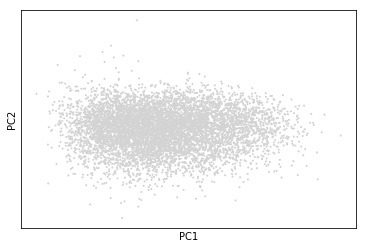

In [4]:
for batch, matrix in batches.items():
    print("PCA plot for batch", batch)
    sc.pl.pca(matrix)

## TGFB1-values in cells

We will check if TGFB1 is present in each of the batches. Then, we make a PCA-plot visualizing TGFB1-counts in the different batches.

TGFB1 present in batch nontreated :  True
Printing TGFB1 PCA plot for batch nontreated


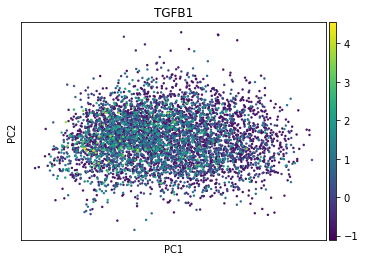

TGFB1 present in batch treated :  True
Printing TGFB1 PCA plot for batch treated


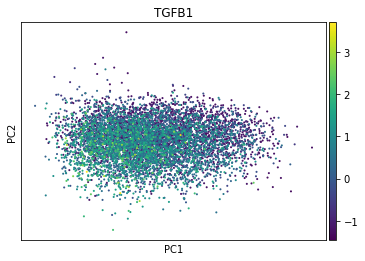

In [5]:
for batch, matrix in batches.items():
    present = any(matrix.var.gene_names == "TGFB1")
    print("TGFB1 present in batch", batch, ": ", present)
    
    if present:
        print("Printing TGFB1 PCA plot for batch", batch)
        sc.pl.pca(matrix, color="TGFB1")

Let's generate a variance ratio plot for each batch. This is useful because it provides insight into how much each PC contributes to the variance of the set. We can use this information as a cut-off for neighborhood graph calculations.

Printing PCA variance ratio for batch nontreated


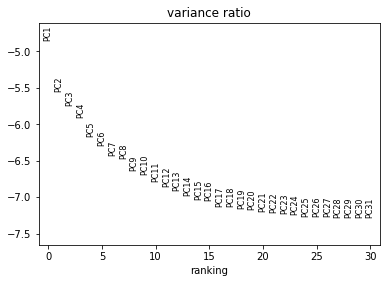

Printing PCA variance ratio for batch treated


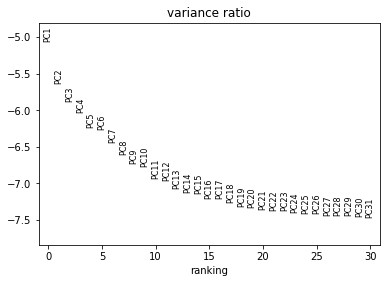

In [6]:
for batch, matrix in batches.items():
    print("Printing PCA variance ratio for batch", batch)
    sc.pl.pca_variance_ratio(matrix, log=True)

## Computing the neighborhood graph

We are computing the neighborhood graph on the cells per each batch, using the previously established principal components.

TODO: For the sake of reproducing Seurat's results, let's take the following values. more descriptive reason?

In [7]:
for batch, matrix in batches.items():
    print("Neighborhood graph calculation for batch", batch)
    sc.pp.neighbors(matrix, n_neighbors=10, n_pcs=40)

Neighborhood graph calculation for batch nontreated
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:03.22) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
Neighborhood graph calculation for batch treated
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:01.32) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


## UMAP

We can use UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)) to get a two-dimensional representation of the neighborhood graph. This method is preferred over tSNE because (per the abstract) "\[it\] is competitive with t-SNE for visualization quality, and arguably preserves more of the global structure with superior run time performance."


In [8]:
for batch, matrix in batches.items():
    print("UMAP calculations for batch", batch)
    sc.tl.umap(matrix)

UMAP calculations for batch nontreated
computing UMAP
    finished (0:00:10.41) --> added
    'X_umap', UMAP coordinates (adata.obsm)
UMAP calculations for batch treated
computing UMAP
    finished (0:00:13.27) --> added
    'X_umap', UMAP coordinates (adata.obsm)


Create a list of marker genes that we want analyze more deeply:

In [9]:
MARKER_GENES = ("TGFB1", "TGFBR1", "TGFBR2", "SERPINE1", "ID3", "PLAUR", "ACTA2", "ACVRL1", "VIM", "S100A4", "SOX4",)

Create UMAP plots for each batch for all the marker genes found in that data set.

Finding marker genes in nontreated
Found the following marker genes: ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'ACVRL1', 'VIM', 'S100A4', 'SOX4'] , printing UMAP plots for these genes.


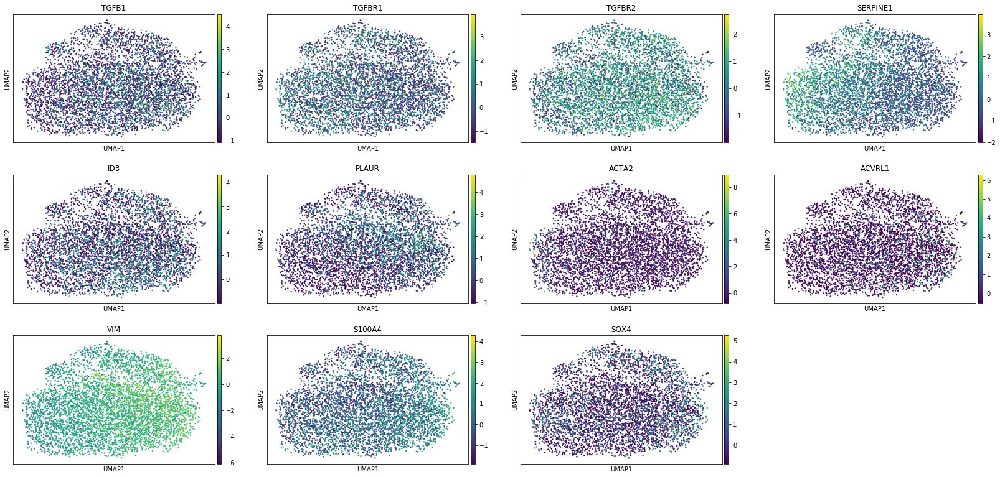

Finding marker genes in treated
Found the following marker genes: ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'ACVRL1', 'VIM', 'S100A4', 'SOX4'] , printing UMAP plots for these genes.


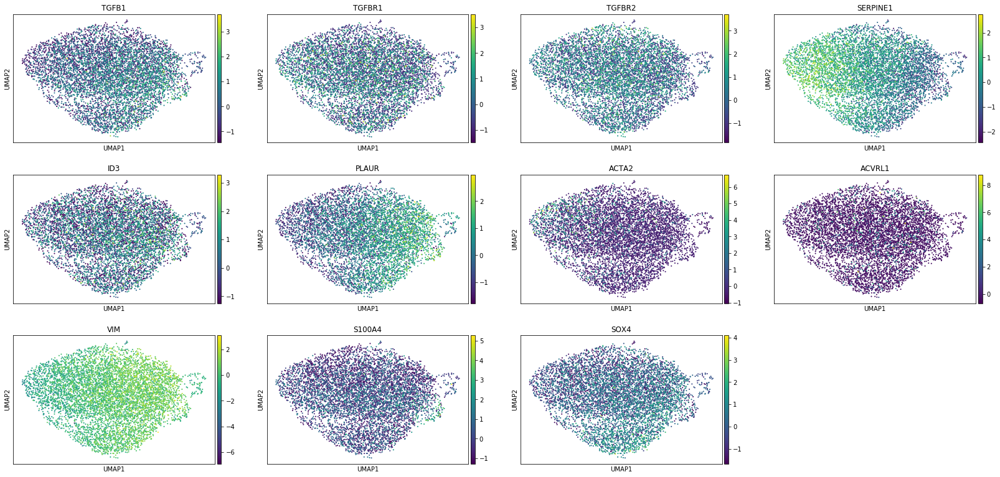

In [10]:
for batch, matrix in batches.items():
    print("Finding marker genes in", batch)
    filter_by = [var for var in MARKER_GENES if var in matrix.var_names]
    print("Found the following marker genes:", filter_by, ", printing UMAP plots for these genes.")
    sc.pl.umap(matrix, color=filter_by)

## Clustering the neighborhood graph

The Louvain clustering method is an effective way to find communities in large networks (such as the neighborhood graph previously computed) through modularity optimizations. The original paper is [Blondel et al. (2008)](https://doi.org/10.1088/1742-5468/2008/10/P10008) and it has been proposed for single-cell analysis by [Levine et al. (2015)](https://doi.org/10.1016/j.cell.2015.05.047).

In [11]:
for batch, matrix in batches.items():
    print("Running Louvain clustering on", batch)
    sc.tl.louvain(matrix)

Running Louvain clustering on nontreated
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.30) --> found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
Running Louvain clustering on treated
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.75) --> found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


We are expecting some of these clusters to highly correlate with the marker genes we named earlier for the S2 (treated) batch.

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch nontreated : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'ACVRL1', 'VIM', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch nontreated


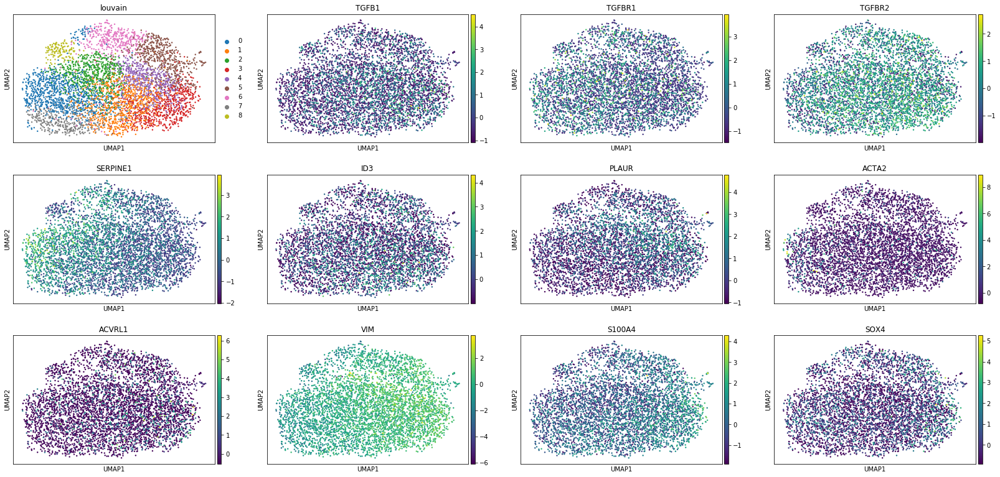

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch treated : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'ID3', 'PLAUR', 'ACTA2', 'ACVRL1', 'VIM', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch treated


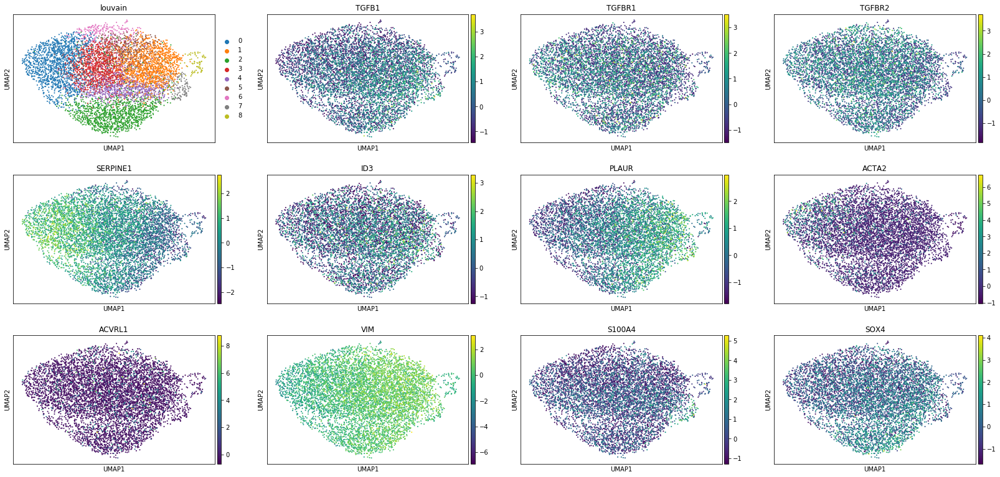

In [12]:
for batch, matrix in batches.items():
    print("Plotting UMAP plot for Louvain clusters, as well as previous marker genes.")
    filter_by = [var for var in MARKER_GENES if var in matrix.var_names]
    print("Found the following marker genes in batch", batch, ":", filter_by)
    filter_by.insert(0, "louvain")
    print("Printing UMAP plots comparing Louvain clusters to marker genes in batch", batch)
    sc.pl.umap(matrix, color=filter_by)

Compute signatures and interesting genes across clusters

TODO: we do not have ALK1 signature genes

In [13]:
SIGNATURES = {"cVSMC signature" : ["ACTA2", "TAGLN", "CNN1", "TAGLN2", "MYOCDN", "SMTN",],"fibroblast signature": ["S100A4", "VIM",],
              "ALK5 signature": ["IL11","COMP", "SERPINE1", "CTGF", "NOX4", "PMEPA4",], "ALK1 signature": ["PLAUR", "KDELR3", "ID3", "ID1", "SCARA3" ],}
GENES_ACROSS_CLUSTERS = ("JARID2", "SOX4", "PLAUR", "SERPINE1", "ID3", "CTGF", "S100A4","VIM",)

Now working on batch nontreated


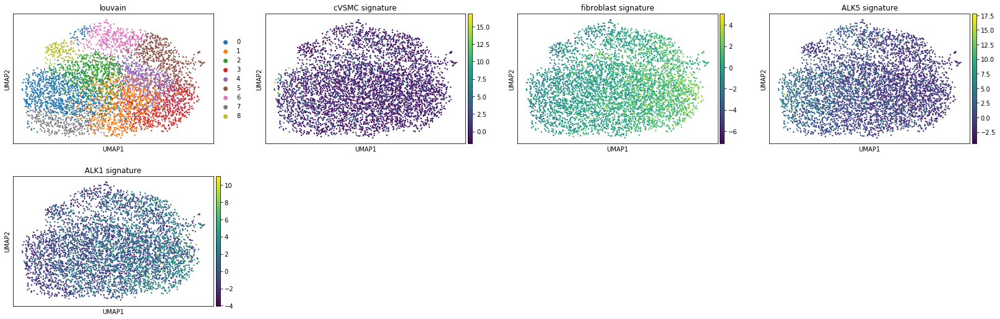

Now working on batch treated


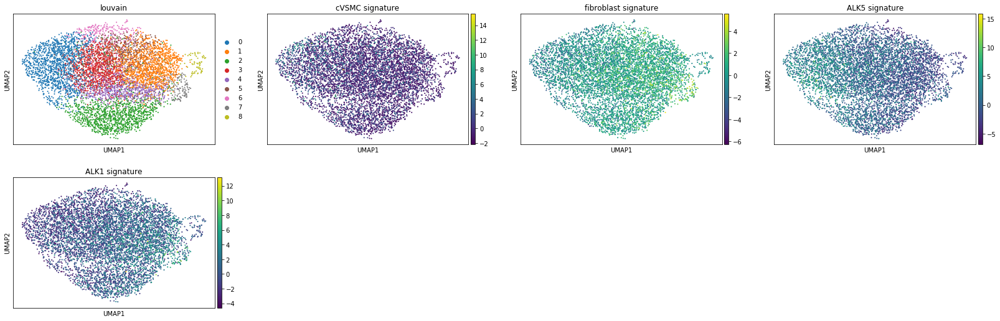

In [14]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        matrix.obs[key] = matrix[:, matrix.var.gene_names.isin(value)].X.sum(1)
    
    sc.pl.umap(matrix, color=['louvain'] + list(SIGNATURES.keys()))

Compute violin plots for signatures and genes above:

Now working on batch nontreated
violin plot for signature cVSMC signature


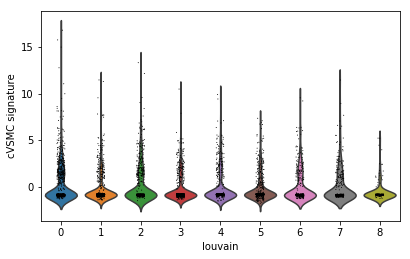

violin plot for signature fibroblast signature


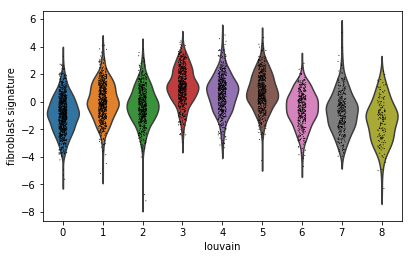

violin plot for signature ALK5 signature


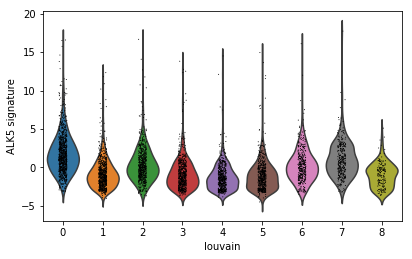

violin plot for signature ALK1 signature


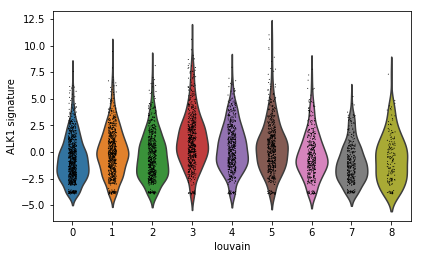

Now working on batch treated
violin plot for signature cVSMC signature


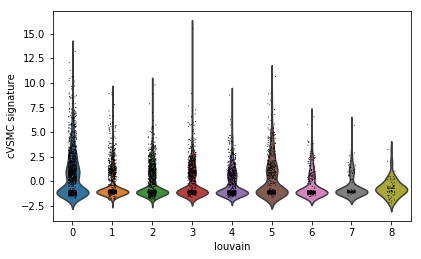

violin plot for signature fibroblast signature


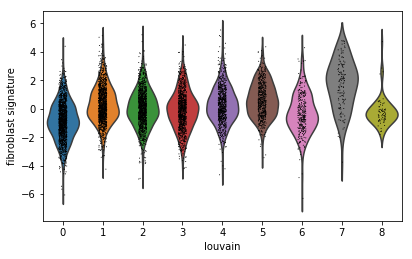

violin plot for signature ALK5 signature


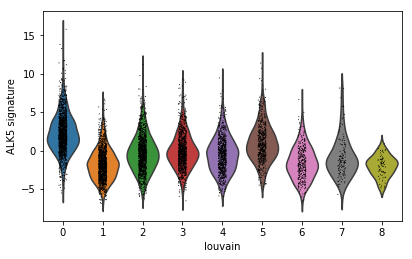

violin plot for signature ALK1 signature


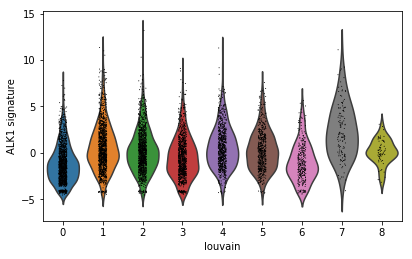

In [15]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        print("violin plot for signature", key)
        sc.pl.violin(matrix, [key], groupby='louvain')

Now working on batch nontreated
plotting for JARID2 across clusters


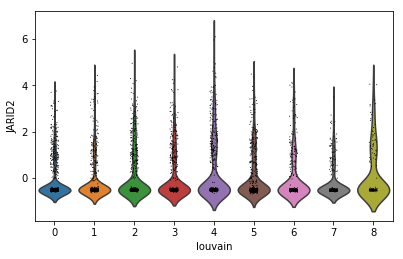

plotting for SOX4 across clusters


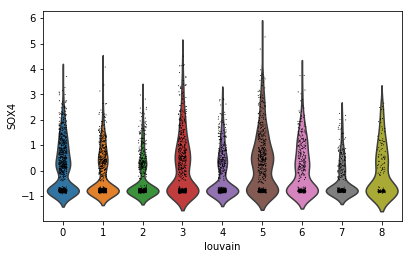

plotting for PLAUR across clusters


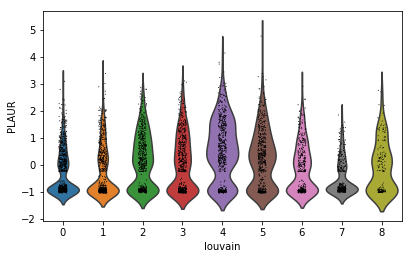

plotting for SERPINE1 across clusters


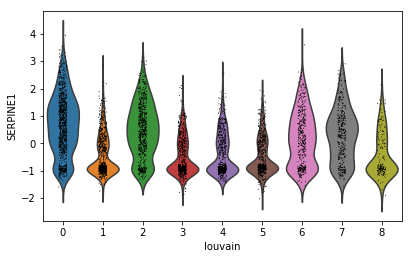

plotting for ID3 across clusters


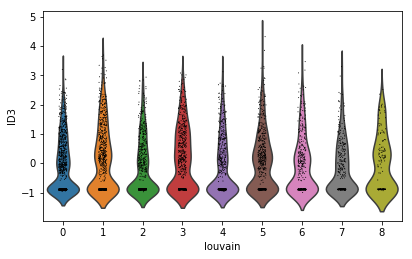

plotting for CTGF across clusters


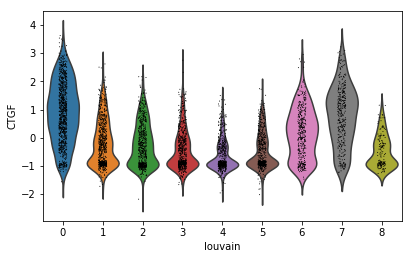

plotting for S100A4 across clusters


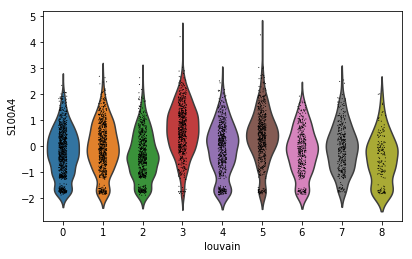

plotting for VIM across clusters


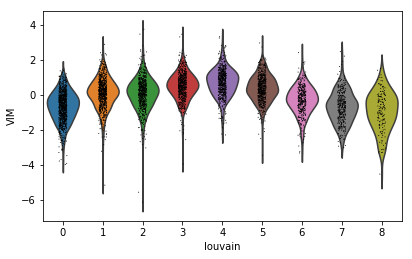

Now working on batch treated
plotting for JARID2 across clusters


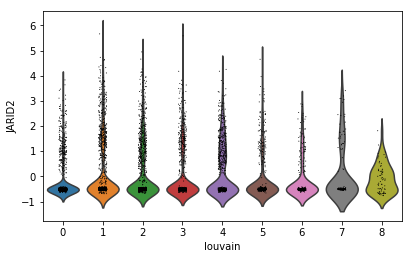

plotting for SOX4 across clusters


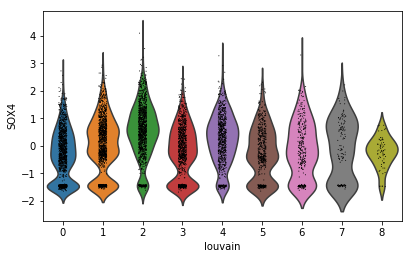

plotting for PLAUR across clusters


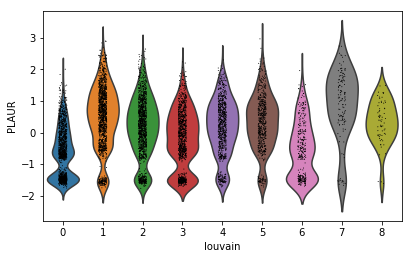

plotting for SERPINE1 across clusters


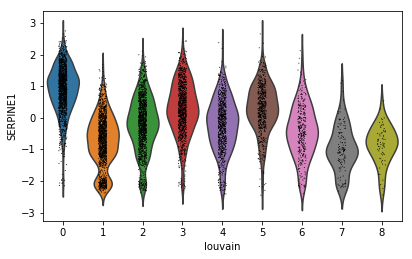

plotting for ID3 across clusters


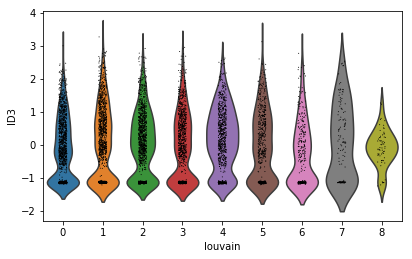

plotting for CTGF across clusters


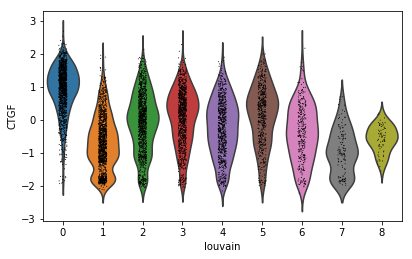

plotting for S100A4 across clusters


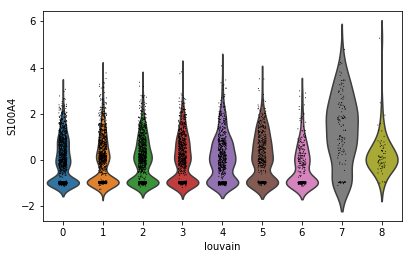

plotting for VIM across clusters


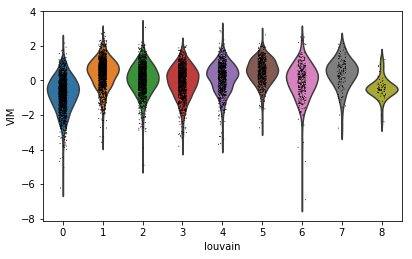

In [16]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    
    for gene in GENES_ACROSS_CLUSTERS:
        try:
            print("plotting for", gene, "across clusters")
            sc.pl.violin(matrix, [gene], groupby='louvain')
        except:
            print("not found")

## FIGURE (for paper)
Louvain clusters and violin plots

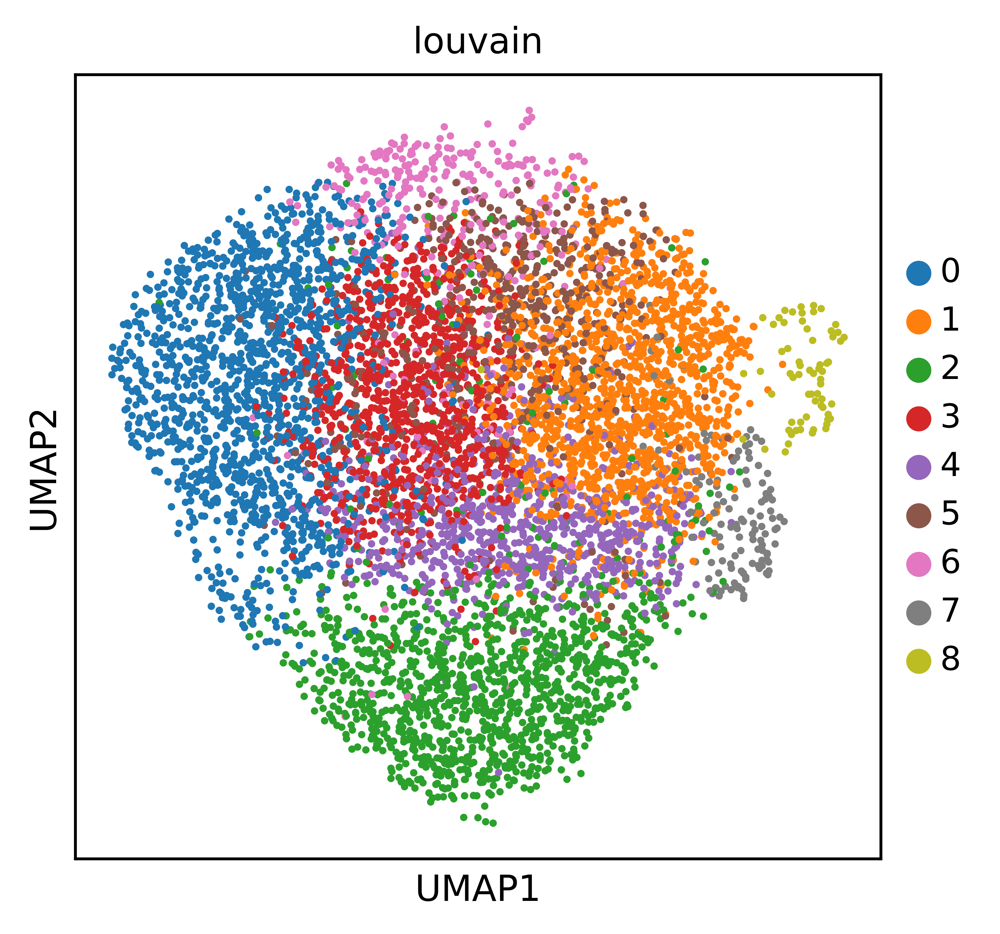

In [20]:
sc.set_figure_params(scanpy=True, dpi=600, dpi_save=600, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
sc.pl.umap(batches["treated"], color="louvain")
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

In [19]:
sc.set_figure_params(scanpy=True, dpi=600, dpi_save=600, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
sc.pl.violin(matrix, SIGNATURES.keys(), groupby='louvain')
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

In [18]:
for batch, matrix in batches.items():
    filename = "tgfb1-4-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    matrix.write(filename)